# [Rolling Papers - Part 1](https://xpuzzlecorner.substack.com/p/rolling-papers-part-1)
## November 3 2024
### By: X's Puzzle Corner

## Problem

1) _How many unique 2D shapes can be created if we ‘unfold’ the faces of the cube into one continuous piece._

2) _How many for a dodecahedron?_

3) _An icosahedron?_

## Solution

We will employ the method described in [Horiyama and Shoji](https://link.springer.com/chapter/10.1007/978-3-642-45030-3_58)

We can first note that the icosahedron and dodecahedron and duals of each other and there are lots of sources, such as [Laison](https://www.academia.edu/31554953/Dual_unfoldings_of_polyhedra) that tell us that they will have thso they will have the same number of unfoldings. So we can limit our attention to the cube and one other, say the icosahedron.

First we need to construct the symmetry group of each of these polygons.

In [ ]:
from sage.all import PermutationGroup, AlternatingGroup, PermutationGroupElement, graphs, SymmetricGroup, CyclicPermutationGroup, direct_product_permgroups, Permutation, TransitiveGroup

# Add reflections by using the full octahedral group
cube_full_symmetry_group = PermutationGroup([
    "(1,2,3,4)(5,8,7,6)",  # Rotation 
    "(1,2,8,5)(4,3,7,6)",  # Rotation 
    "(1,5,6,4)(2,8,7,3)",  # Rotation 
    "(1,5)(2,8)(3,7)(4,6)",  # Reflection through xy-plane
    "(1,4)(2,3)(5,6)(8,7)",  # Reflection through yz-plane
    "(1,2)(5,8)(6,7)(4,3)"   # Reflection through xz-plane
])

# Verify the group order (should be 48 for the full octahedral group)
print("Order of the full symmetry group:", cube_full_symmetry_group.order())
print("Full symmetry group elements:", cube_full_symmetry_group.list())

# https://www.scribd.com/document/793584435/The-Icosahedral-Point-Groups-BY-DANIEL-B-LITVIN
icosahedron_full_symmetry_group = PermutationGroup([
    "(1,2)(3,6)(4,11)(5,7)(8,10)(9,12)",
    "(1,4,3)(2,5,8)(6,9,7)(10,12,11)",
    "(1)(12)(2,6,5,4,3)(7,11,10,9,8)",
    "(1,12)(2,9)(3,10)(4,11)(5,7)(6,8)"])

# Verify the group order (should be 120 for the full icosahedral group)
print("Order of the full symmetry group:", icosahedron_full_symmetry_group.order())
print("Full symmetry group elements:", icosahedron_full_symmetry_group.list())

We also represent each polygon as a graph where the vertices are the corners of the polygon and the edges are the sides of the polygon. We can then represent the symmetry group as a permutation group on the vertices of the graph.

In [ ]:
from matplotlib import pyplot as plt
import networkx as nx

# Create the cube graph Γ with vertices incremented by 1
cube_graph = nx.relabel_nodes(nx.cubical_graph(), lambda x: x + 1)
print("Cube Edges", cube_graph.edges())

# Draw the graph
nx.draw(cube_graph, with_labels=True, node_color='lightblue', edge_color='gray')
plt.title('Icosahedral Graph')
plt.show()

# Create the dodectahedron graph Δ with vertices incremented by 1 (this does match the permutation group so we'll define our own)
# icosahedron_graph = nx.relabel_nodes(nx.icosahedral_graph(), lambda x: x + 1)
# print("Icosahedron Edges", icosahedron_graph.edges())

# Define the corrected edge list based on the icosahedron properties
edges = [
    (1, 2), (1, 3), (1, 4), (1, 5), (1, 6),
    (2, 3), (2, 6), (2, 7), (2, 11), 
    (3, 4), (3, 7), (3, 8),
    (4, 5), (4, 9), (4, 8),
    (5, 6), (5, 9), (5, 10),
    (6, 10), (6, 11),
    (7, 8), (7, 11), (7, 12),
    (8, 9), (8, 12),
    (9, 10), (9, 12),
    (10, 11), (10, 12),
    (11, 12)
]

# Create the graph in NetworkX
icosahedron_graph = nx.Graph()
icosahedron_graph.add_edges_from(edges)
# Draw the graph
nx.draw(icosahedron_graph, with_labels=True, node_color='lightblue', edge_color='gray')
plt.title('Icosahedral Graph')
plt.show()

A few checks to make sure we constructed the symmetry group consistently with the graph representation. This burned me a few times.

In [4]:
# Checks to ensure the graph and permutation group match

# Function to apply permutation to the graph
def apply_permutation_to_graph(graph, permutation):
    perm_dict = permutation.dict()
    new_labels = {v: perm_dict.get(v, v) for v in graph.nodes()}
    new_graph = nx.relabel_nodes(graph, new_labels)
    return new_graph

# Check adjacency preservation
def check_adjacency_preservation(graph, permutation):
    permuted_graph = apply_permutation_to_graph(graph, permutation)
    for node in graph.nodes():
        original_neighbors = set(graph.neighbors(node))
        permuted_neighbors = set(permuted_graph.neighbors(node))
        if original_neighbors != permuted_neighbors:
            return False
    return True

# # Verify adjacency preservation for all permutations
print("Cube Graph matches permutation group:", all(check_adjacency_preservation(cube_graph, perm) for perm in cube_full_symmetry_group))
# for perm in cube_full_symmetry_group:
#     if not check_adjacency_preservation(cube_graph, perm):
#         print(f"Adjacency not preserved for permutation: {perm}")
#     else:
#         print(f"Adjacency preserved for permutation: {perm}")

# Verify adjacency preservation for all permutations
print("Icosahedron Graph matches permutation group:", all(check_adjacency_preservation(icosahedron_graph, perm) for perm in icosahedron_full_symmetry_group))
# for perm in icosahedron_full_symmetry_group:
#     if not check_adjacency_preservation(icosahedron_graph, perm):
#         print(f"Adjacency not preserved for permutation: {perm}")
#     else:
#         print(f"Adjacency preserved for permutation: {perm}")

Cube Graph matches permutation group: True
Icosahedron Graph matches permutation group: True


Now let's begin writing functions that can compute the values we need:
1. The number of spanning trees of a graph
2. The number of invariant edges after applying a permutation to the vertices of a graph
3. The quotient graph after applying a permutation to the vertices of a graph

In [5]:
import numpy as np

def number_of_spanning_trees(graph):
    """
    Computes the number of spanning trees for an arbitrary graph.
    
    Parameters:
        graph: A NetworkX graph object (may or may not be connected).
        
    Returns:
        int: The number of spanning trees. Returns 0 for disconnected graphs or empty graphs.
    """
    # Check if the graph is empty
    if len(graph.nodes) == 0:
        return 0  # No spanning tree exists for an empty graph

    # Check if the graph is connected
    if not nx.is_connected(graph):
        return 0  # No spanning tree exists for a disconnected graph

    # Compute the Laplacian matrix
    laplacian = nx.laplacian_matrix(graph).todense()

    # Remove the first row and column to get a minor (cofactor)
    laplacian_minor = laplacian[1:, 1:]  # Remove row 0 and column 0

    # Compute the determinant of the minor
    num_spanning_trees = int(round(np.linalg.det(laplacian_minor)))

    return num_spanning_trees

def invariant_subgraph(graph, permutation):
    """
    Returns the subgraph that remains invariant under the given symmetry action (permutation).
    
    Parameters:
        graph: The input NetworkX graph.
        permutation: A PermutationGroupElement representing the symmetry action.
        
    Returns:
        A subgraph of `graph` that is invariant under the given permutation.
    """
    # Ensure vertex labels are integers to match the permutation domain
    if not all(isinstance(v, int) for v in graph.nodes()):
        raise ValueError("Graph vertices must be integers to match the permutation domain.")
    
    # Find fixed vertices (vertices mapped to themselves)
    perm = permutation.dict()
    fixed_vertices = [v for v in graph.nodes() if perm[v] == v]
    
    # Find fixed edges (both endpoints are fixed)
    fixed_edges = [e for e in graph.edges() if e[0] in fixed_vertices and e[1] in fixed_vertices]
    
    # Create the subgraph with fixed vertices and edges
    invariant_subgraph = graph.edge_subgraph(fixed_edges).copy()
    # print("Fixed vertices:", fixed_vertices)
    # print("Fixed edges:", fixed_edges)
    
    return invariant_subgraph


In [6]:
# Some sanity checks

# Number of spanning trees in the cube graph
num_spanning_trees_cube = number_of_spanning_trees(cube_graph)
print("Number of spanning trees in the cube graph:", num_spanning_trees_cube)

# Example of finding an invariant subgraph under a random permutation
perm = cube_full_symmetry_group.random_element()
print("Random permutation:", perm)
invariant_subgraph_cube = invariant_subgraph(cube_graph, perm)
print("Invariant subgraph edges:", invariant_subgraph_cube.edges())
# Number of spanning trees in the invariant subgraph
num_spanning_trees_invariant = number_of_spanning_trees(invariant_subgraph_cube)
print("Number of spanning trees in the invariant subgraph:", num_spanning_trees_invariant)

# Number of spanning trees in the icosahedron graph
num_spanning_trees_icosahedron = number_of_spanning_trees(icosahedron_graph)
print("Number of spanning trees in the icosahedron graph:", num_spanning_trees_icosahedron)

# Example of finding an invariant subgraph under a random permutation
perm = icosahedron_full_symmetry_group.random_element()
print("Random permutation:", perm)
invariant_subgraph_icosahedron = invariant_subgraph(icosahedron_graph, perm)
print("Invariant subgraph edges:", invariant_subgraph_icosahedron.edges())
# Number of spanning trees in the invariant subgraph
num_spanning_trees_invariant = number_of_spanning_trees(invariant_subgraph_icosahedron)
print("Number of spanning trees in the invariant subgraph:", num_spanning_trees_invariant)

Number of spanning trees in the cube graph: 384
Random permutation: (1,4,3,2)(5,6,7,8)
Invariant subgraph edges: []
Number of spanning trees in the invariant subgraph: 0
Number of spanning trees in the icosahedron graph: 5184000
Random permutation: (2,6)(3,5)(7,10)(8,9)
Invariant subgraph edges: [(1, 4), (11, 12)]
Number of spanning trees in the invariant subgraph: 0


In [7]:
def construct_quotient_graph(G, permutation):
    """
    Constructs the quotient graph Q(G, g) from a graph G and a permutation g.

    Parameters:
    - G: A NetworkX graph representing Γ.
    - permutation: A dictionary representing the permutation g, where keys are nodes of G,
                   and values are the images of the nodes under g.

    Returns:
    - Q: A NetworkX MultiGraph representing the quotient graph Q(Γ, g).
    """
    # Step 1: Define Orbits of Vertices
    orbits = []
    visited = set()
    nodes = list(G.nodes())
    node_to_orbit = {}
    permutation_dict = permutation.dict()

    for v in nodes:
        if v not in visited:
            # Compute the orbit of v under g
            orbit = set()
            current = v
            while True:
                orbit.add(current)
                visited.add(current)
                current = permutation_dict[current]
                if current == v:
                    break
            orbit = frozenset(orbit)
            for node in orbit:
                node_to_orbit[node] = orbit
            orbits.append(orbit)

    # Step 2: Handle Fixed Vertices
    fixed_vertices = [v for v in nodes if permutation_dict[v] == v]
    fixed_vertex_set = frozenset(fixed_vertices) if fixed_vertices else None

    # Remove single-element orbits that are part of fixed vertices
    if fixed_vertex_set:
        orbits = [orbit for orbit in orbits if not (len(orbit) == 1 and list(orbit)[0] in fixed_vertices)]

    # Step 3: Define the Vertex Set of Q(G, g)
    U = set()
    if fixed_vertex_set:
        U.add(fixed_vertex_set)
    U.update(orbits)

    # Step 4: Identify Edge Orbits
    def find_edge_orbit(edge):
        """Find all edges in the same orbit as the given edge under the permutation."""
        u, v = edge
        orbit = set()
        current_edge = edge
        while True:
            orbit.add(current_edge)
            u, v = current_edge
            next_u = permutation_dict[u]
            next_v = permutation_dict[v]
            current_edge = tuple(sorted((next_u, next_v)))
            # current_edge = (next_u, next_v)
            if current_edge == edge:
                break
        return frozenset(orbit)

    all_edges = set(tuple(sorted(edge)) for edge in G.edges())
    edge_orbits = []
    visited_edges = set()

    for edge in all_edges:
        if edge not in visited_edges:
            orbit = find_edge_orbit(edge)
            edge_orbits.append(orbit)
            visited_edges.update(orbit)

    # Step 5: Construct Q(G, g)
    Q = nx.MultiGraph()
    # Add nodes to Q
    for orbit in U:
        Q.add_node(orbit)
    
    # Step 6: Count Unique Edge Orbits for the Quotient Graph
    for orbit in edge_orbits:
        # Determine the quotient graph nodes connected by this edge orbit
        sample_edge = next(iter(orbit))
        u, v = sample_edge
        pi_u = node_to_orbit.get(u, frozenset([u]))
        pi_v = node_to_orbit.get(v, frozenset([v]))
        if u in fixed_vertices:
            pi_u = fixed_vertex_set
        if v in fixed_vertices:
            pi_v = fixed_vertex_set
        if pi_u != pi_v:
            Q.add_edge(pi_u, pi_v)
    # print("Edge orbits:", edge_orbits)
    return Q

In [8]:
def invariant_edges(graph, permutation):
    """
    Returns the set of invariant edges under the given symmetry action (permutation).
    Edges are invariant if both endpoints are fixed or mapped to each other.
    
    Parameters:
        graph: The input NetworkX graph.
        permutation: A PermutationGroupElement representing the symmetry action.
        
    Returns:
        A set of edges of `graph` that are invariant under the given permutation.
    """
    # Find fixed vertices (vertices mapped to themselves)
    perm = permutation.dict()    
    # Find invariant edges (both endpoints are fixed or mapped to each other)
    invariant_edges = {(u, v) for u, v in graph.edges() if (perm[u] == v and perm[v] == u) or (perm[u] == u and perm[v] == v)}
    
    return invariant_edges

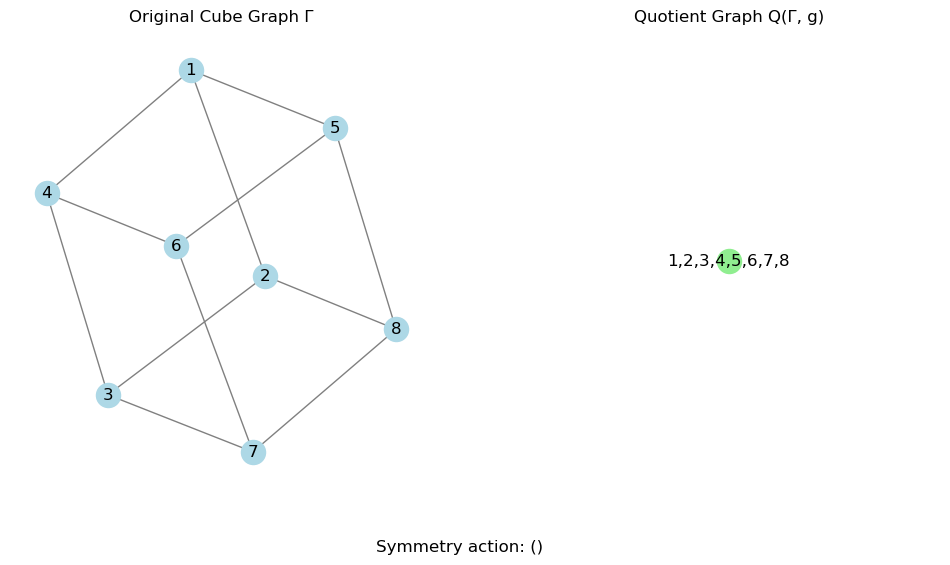

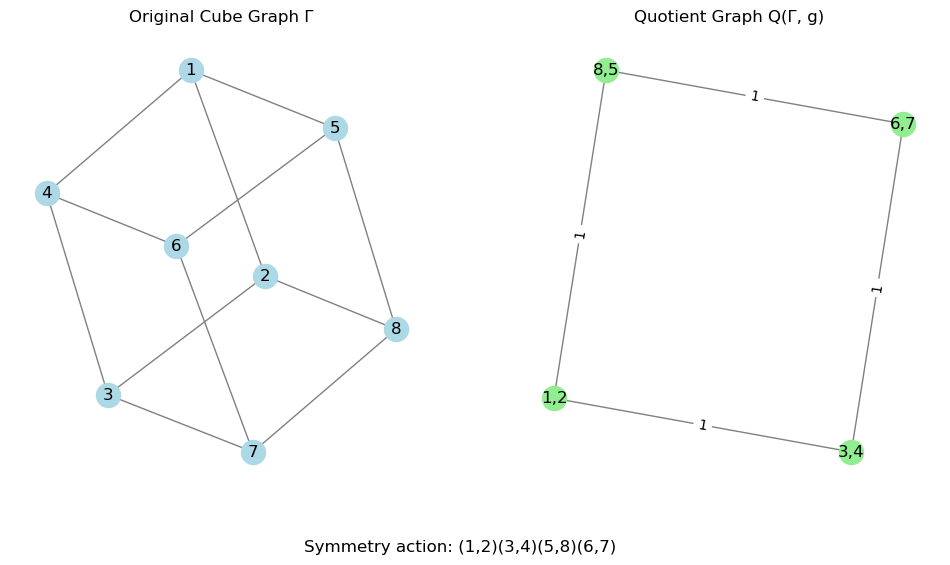

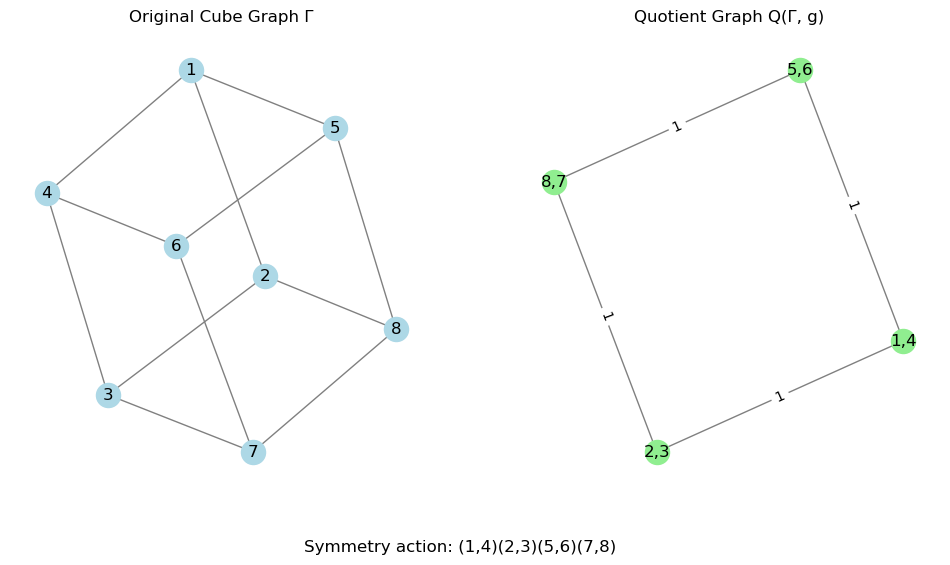

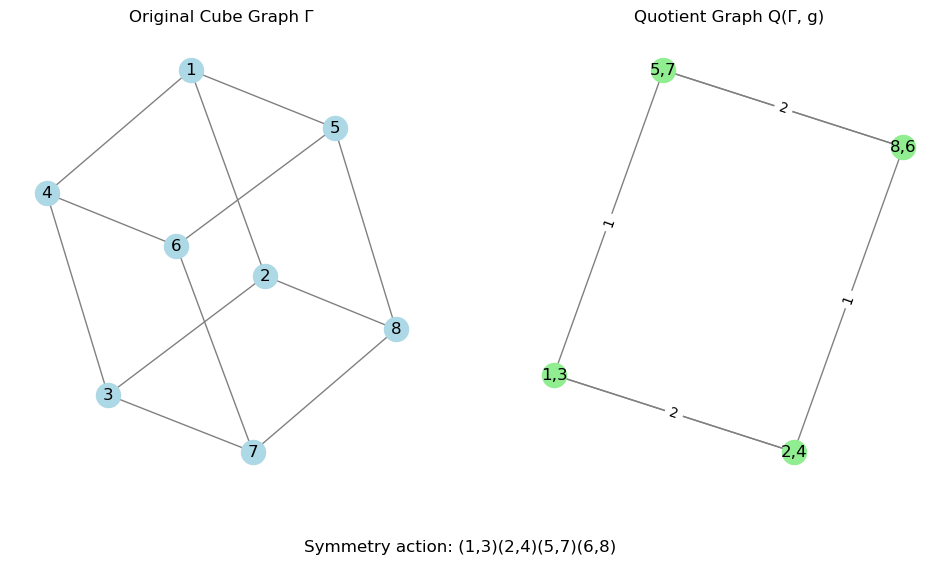

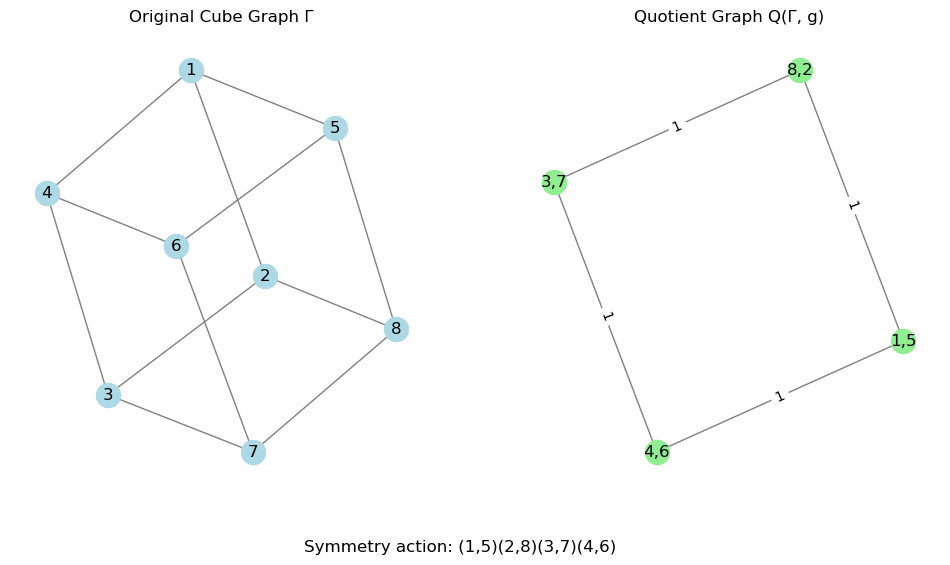

...

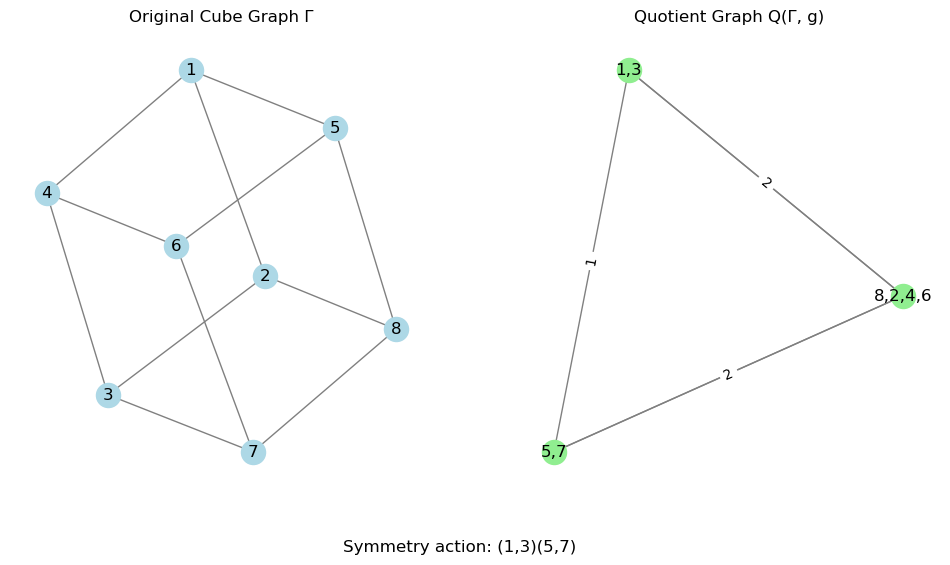

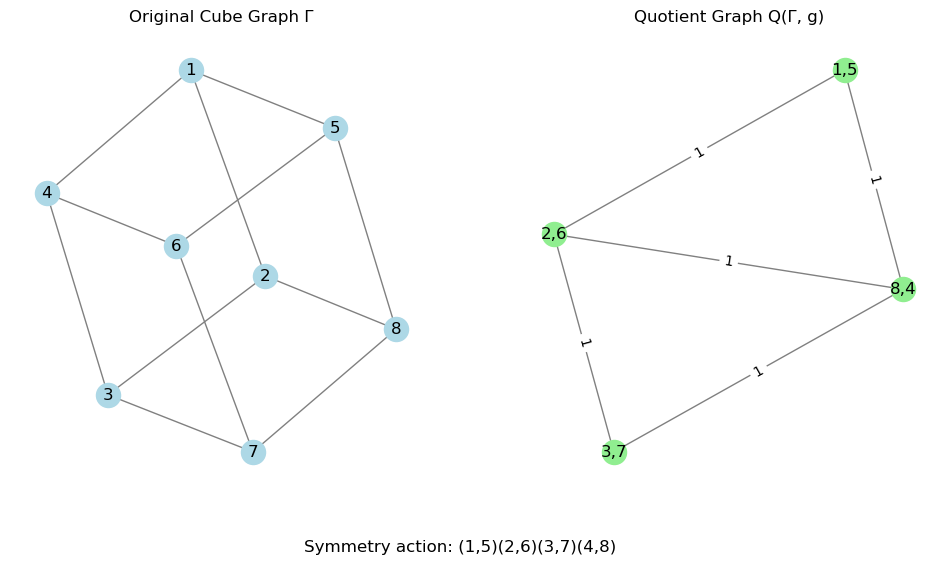

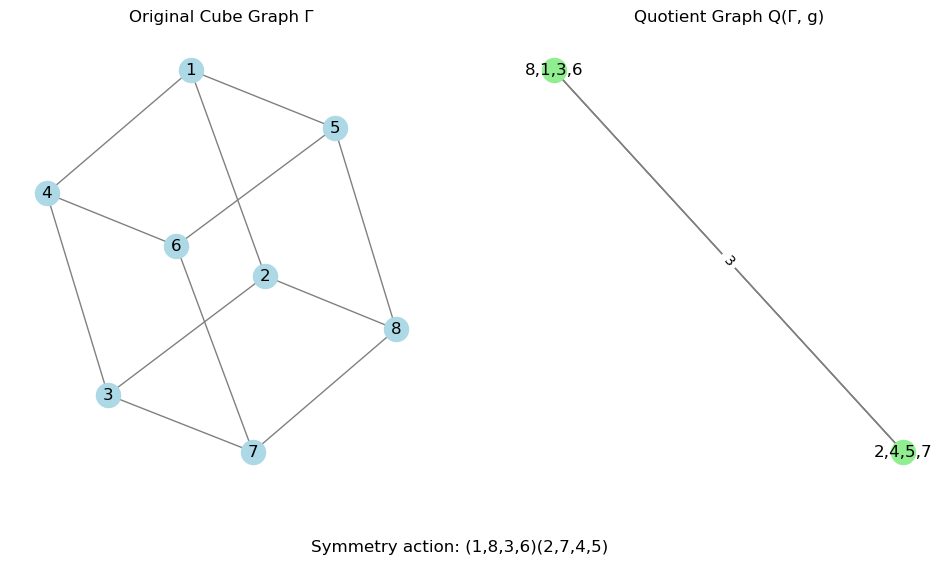

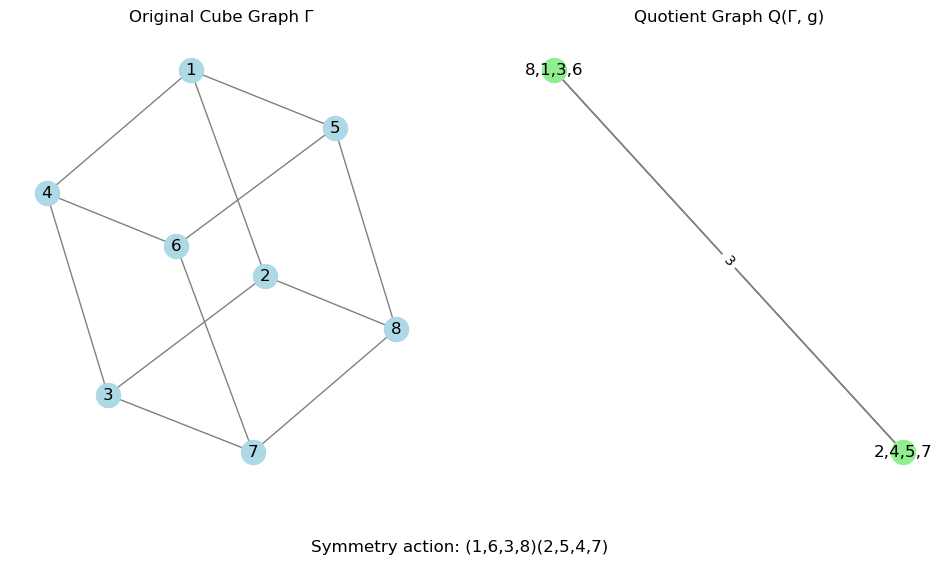

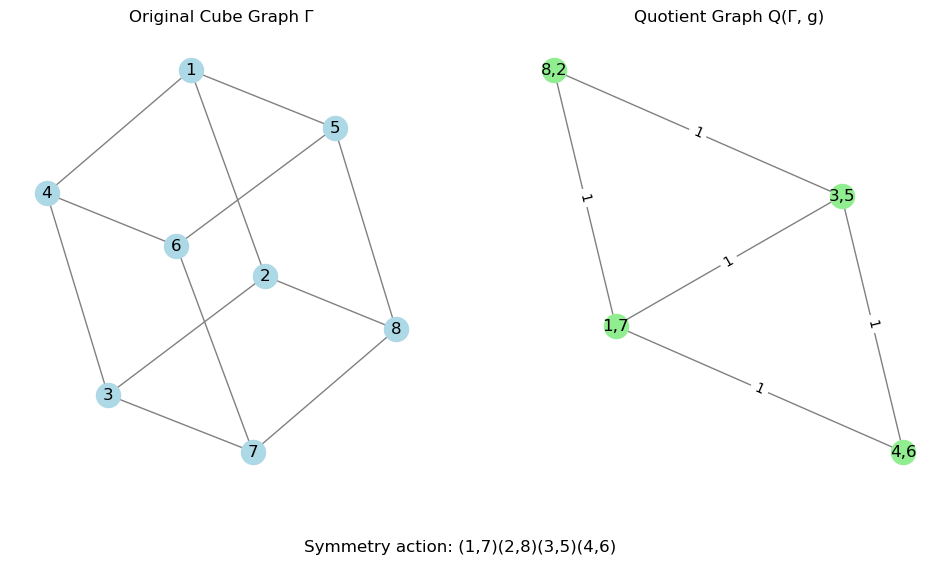

In [9]:
# Visualize the quotient graph for each cube symmetry action

# for g in [Permutation("(1,2,3,4)(5,8,7,6)")]:
for g in cube_full_symmetry_group:
    # Construct the quotient graph Q(G, g)
    quotient_graph = construct_quotient_graph(cube_graph, g)

    # Visualize the original cube graph and the quotient graph
    # Position nodes for visualization
    pos_cube = nx.spring_layout(cube_graph, seed=42)
    pos_quotient = nx.spring_layout(quotient_graph, seed=42)

    # Plot the original cube graph
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    nx.draw(cube_graph, pos_cube, with_labels=True, node_color='lightblue', edge_color='gray')
    plt.title("Original Cube Graph Γ")

    # Plot the quotient graph
    plt.subplot(1, 2, 2)
    # Relabel nodes for readability
    Q_labels = {orbit: ','.join(map(str, orbit)) for orbit in quotient_graph.nodes()}
    nx.draw(quotient_graph, pos_quotient, with_labels=True, labels=Q_labels, node_color='lightgreen', edge_color='gray')

    # Add edge labels to show the number of edges between nodes
    edge_labels = {(u, v): quotient_graph.number_of_edges(u, v) for u, v in quotient_graph.edges()}
    nx.draw_networkx_edge_labels(quotient_graph, pos_quotient, edge_labels=edge_labels)

    plt.title("Quotient Graph Q(Γ, g)")
    # Add a box at the bottom to show the actual mapping/action
    plt.figtext(0.5, 0.01, f"Symmetry action: {g}", wrap=True, horizontalalignment='center', fontsize=12)
    # print("Vertex mapping:", g)
    # print("Edges: ", quotient_graph.edges())
    plt.show()

/var/folders/5j/d_pmm93d5qb7mpv0d38kkm8m0000gn/T/ipykernel_12434/2588786710.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 6))


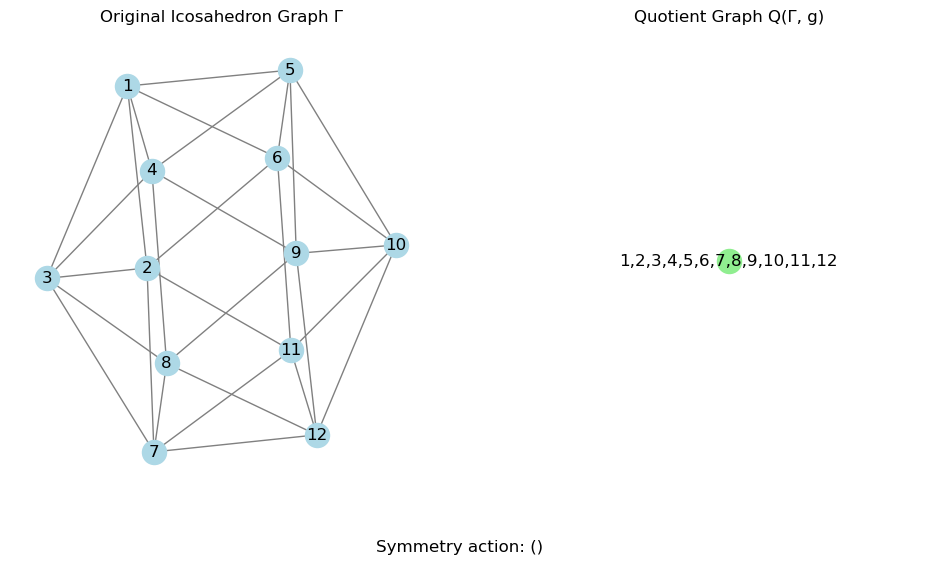

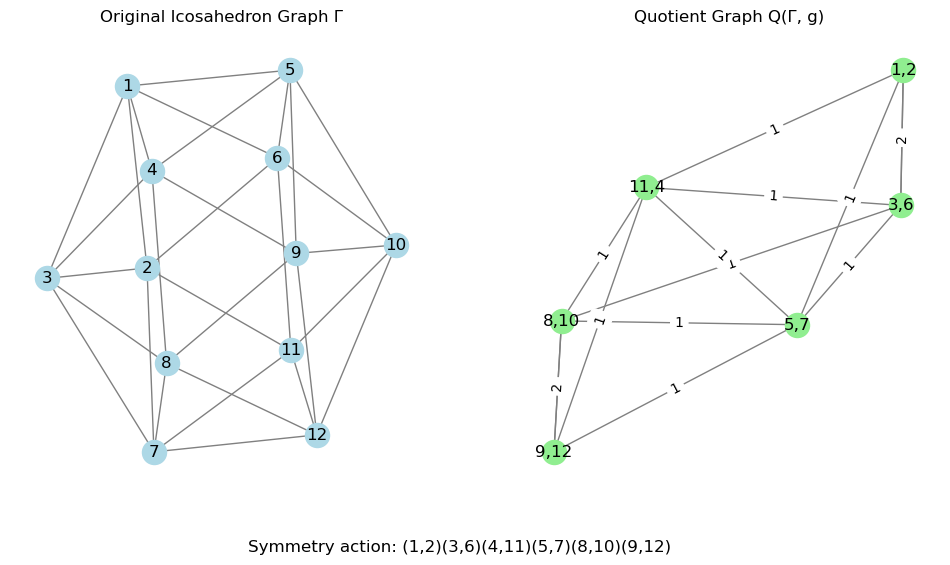

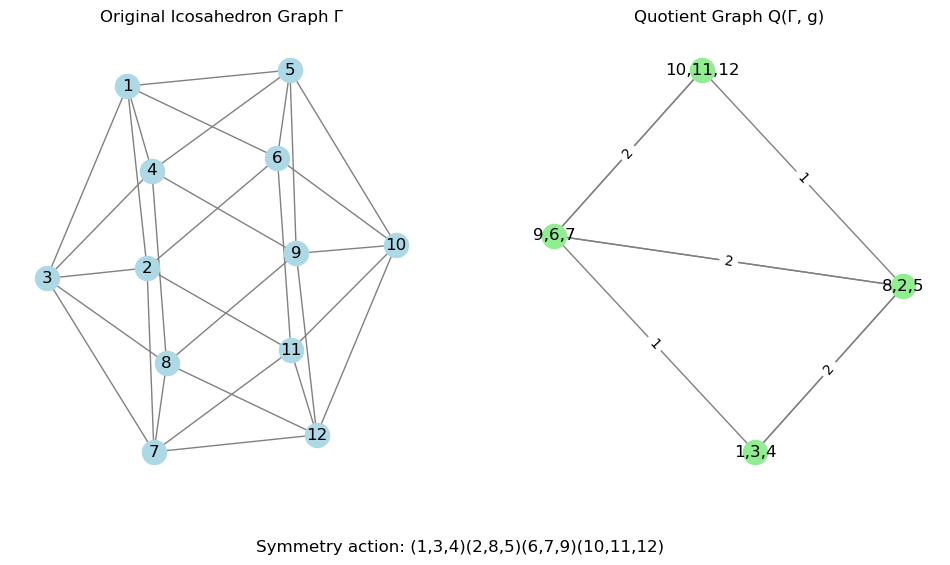

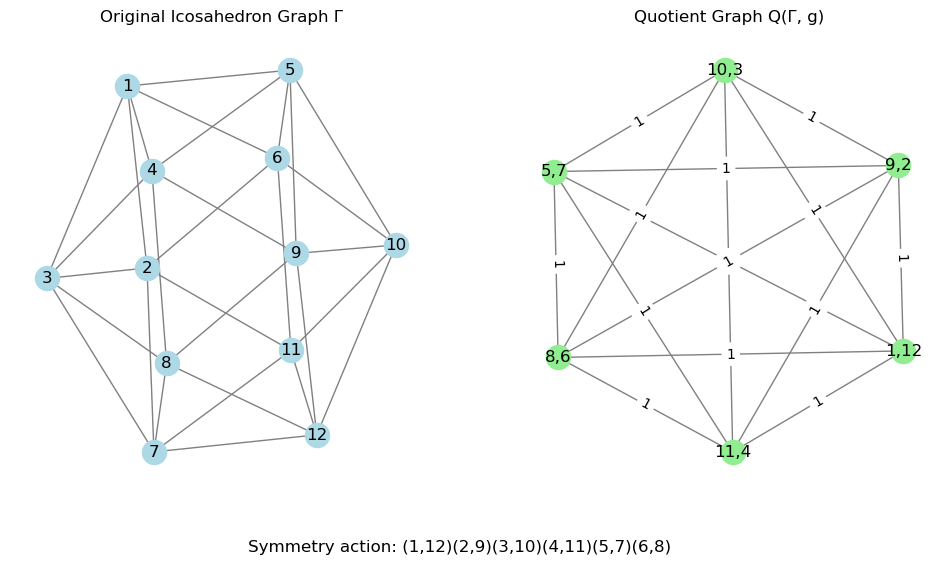

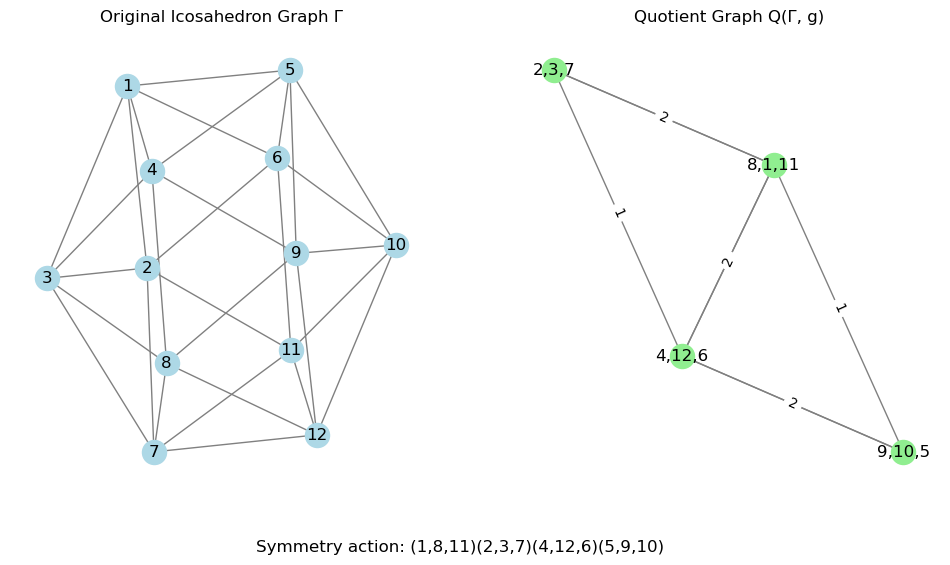

...

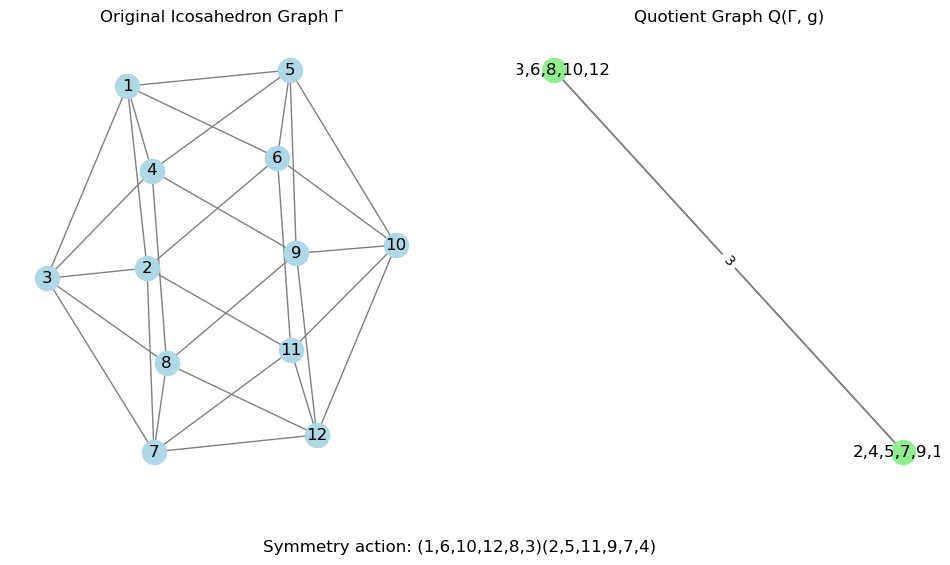

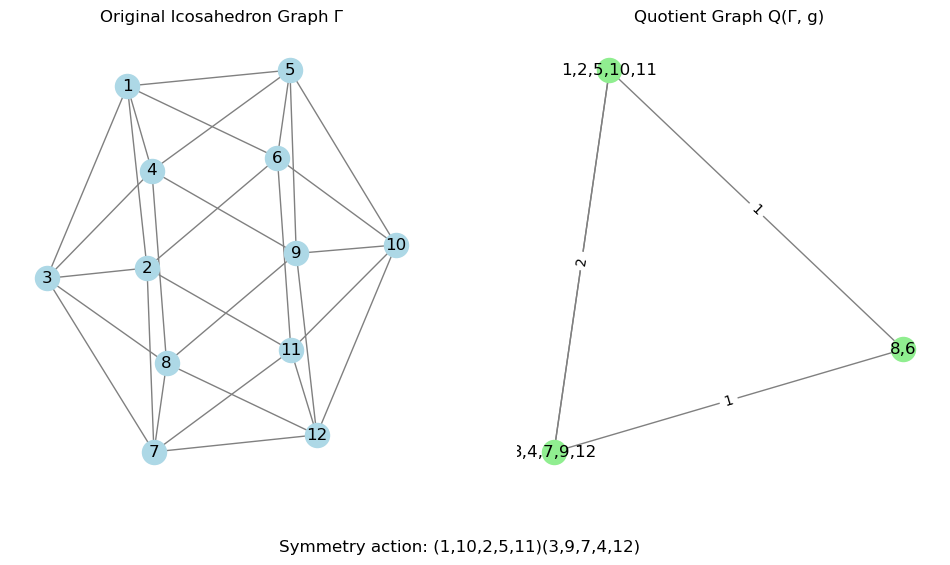

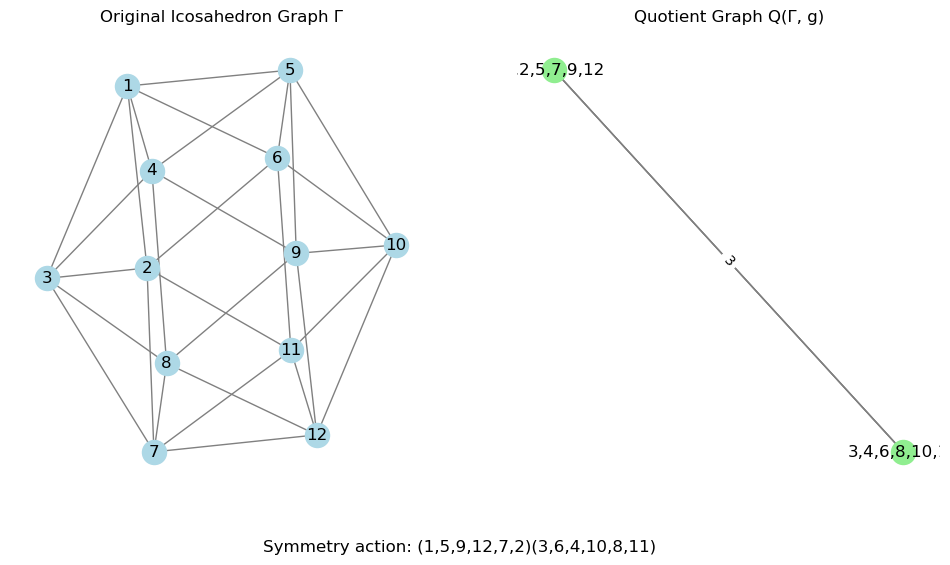

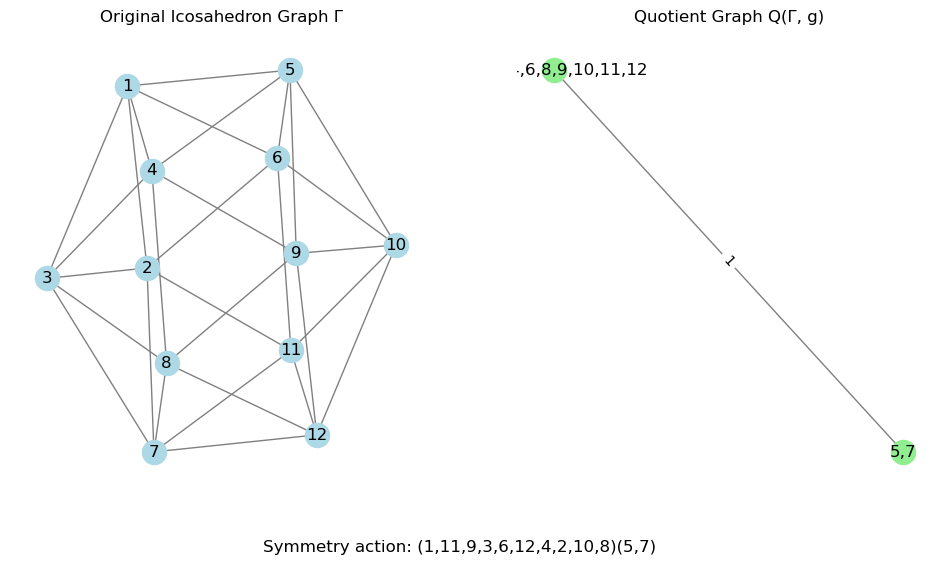

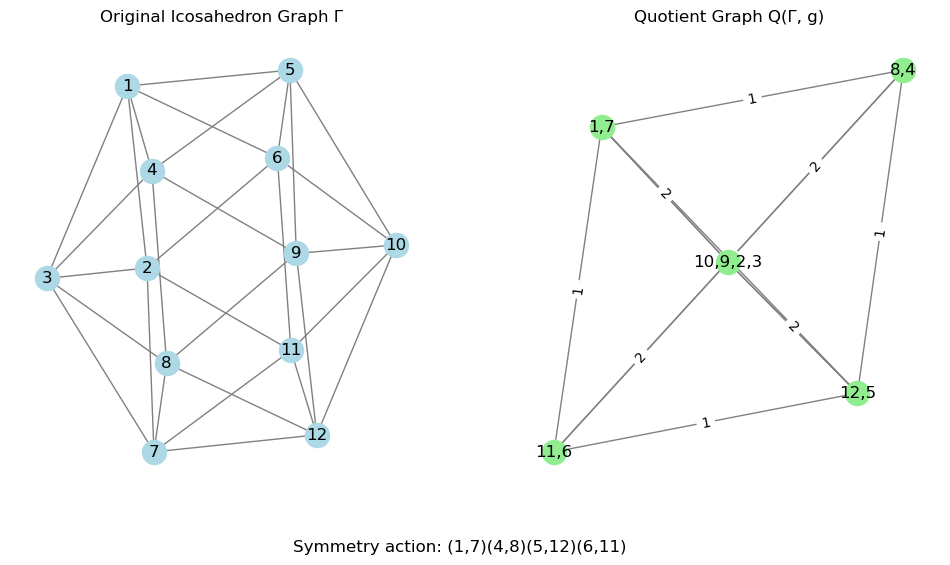

In [24]:
# Visualize the quotient graph for each icosahedron symmetry action

for g in icosahedron_full_symmetry_group:
    # Construct the quotient graph Q(G, g)
    quotient_graph = construct_quotient_graph(icosahedron_graph, g)

    # Visualize the original cube graph and the quotient graph
    # Position nodes for visualization
    pos_icosahedron = nx.spring_layout(icosahedron_graph, seed=42)
    pos_quotient = nx.spring_layout(quotient_graph, seed=42)

    # Plot the original cube graph
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    nx.draw(icosahedron_graph, pos_icosahedron, with_labels=True, node_color='lightblue', edge_color='gray')
    plt.title("Original Icosahedron Graph Γ")

    # Plot the quotient graph
    plt.subplot(1, 2, 2)
    # Relabel nodes for readability
    Q_labels = {orbit: ','.join(map(str, orbit)) for orbit in quotient_graph.nodes()}
    nx.draw(quotient_graph, pos_quotient, with_labels=True, labels=Q_labels, node_color='lightgreen', edge_color='gray')

    # Add edge labels to show the number of edges between nodes
    edge_labels = {(u, v): quotient_graph.number_of_edges(u, v) for u, v in quotient_graph.edges()}
    nx.draw_networkx_edge_labels(quotient_graph, pos_quotient, edge_labels=edge_labels)

    plt.title("Quotient Graph Q(Γ, g)")
    # Add a box at the bottom to show the actual mapping/action
    plt.figtext(0.5, 0.01, f"Symmetry action: {g}", wrap=True, horizontalalignment='center', fontsize=12)
    # print("Vertex mapping:", g)
    # print("Edges: ", quotient_graph.edges())
    
    # Surpressing all the isohedron plots for now
    # plt.show()

In [15]:
def compute_unfoldings(symmetry_group, graph):
    """
    Computes the number of unfoldings of a given graph under a symmetry group.

    Parameters:
    - symmetry_group: A PermutationGroup representing the symmetry group G.
    - graph: A NetworkX graph representing the graph Γ.

    Returns:
    - int: The number of unfoldings of the graph under the symmetry group.
    """

    total = 0

    for g in symmetry_group:
        # Check if fix(g) is empty (all values of g.to_dict() are not equal to the key)
        # print(g)
        fix_empty = all(v != k for k, v in g.dict().items())
        # print("Fix empty:", fix_empty)
        
        # Check if all orbits are of same length for non-fixed vertices
        if g == symmetry_group.identity():
            orbits_same = True
            order_2 = False
        else:
            orbits = [tuple(orb) for orb in g.cycle_tuples() if len(orb) > 1]
            orbits_same = len(set(len(orb) for orb in orbits)) == 1
            order_2 = all(len(orb) == 2 for orb in orbits)
        # print("Orbits same length:", orbits_same)

        inv_subgraph = invariant_subgraph(graph, g)
        inv_edges = invariant_edges(graph, g)
        # print("Invariant edges:", invariant_edges)

        quotient_graph = construct_quotient_graph(graph, g)
        num_quotient_spanning_trees = number_of_spanning_trees(quotient_graph)
        # print("Quotient spanning trees:", num_quotient_spanning_trees)

        num_fix_spanning_trees = number_of_spanning_trees(inv_subgraph)

        num_fix_edges = len(inv_edges)

        is_disconnected = not nx.is_connected(inv_subgraph) if len(inv_subgraph.nodes) != 0 else False

        add = 0
        if not fix_empty and orbits_same:
            add = num_quotient_spanning_trees * num_fix_spanning_trees
        elif order_2 and fix_empty:
            add = num_quotient_spanning_trees * num_fix_edges
        elif not fix_empty and is_disconnected:
            add = 0
        elif fix_empty and num_fix_edges == 0:
            add = 0
        # print(f"g: {g}, fix_empty: {fix_empty}, orbits_same: {orbits_same}, order_2: {order_2}, invariant_edges: {inv_edges}, num_quotient_spanning_trees: {num_quotient_spanning_trees}, num_fix_spanning_trees: {num_fix_spanning_trees}, num_fix_edges: {num_fix_edges}, is_disconnected: {is_disconnected}, add: {add}")
        total += add
        
    return total

In [27]:
print("Number of cube unfoldings:", compute_unfoldings(cube_full_symmetry_group, cube_graph)/48)

Number of cube unfoldings: 11.0


In [ ]:
print("Number of icosahedron unfoldings:", compute_unfoldings(icosahedron_full_symmetry_group, icosahedron_graph)/120)

Number of icosahedron unfoldings: 43380.0
